<p style = "font-size : 35px; color :#000080 ; font-family : 'Calibri'; text-align : center; background-color : #808080; border-radius: 5px 5px;"><strong>PROJET IA 2024 : FAKE NEWS</strong></p>


<img style="float: center;  border:5px solid #DC143C; width:75%" src = https://miro.medium.com/max/1320/1*VIEVy548fut8IJotJlQKSQ.jpeg>

Les fausses informations désignent les informations erronées, la désinformation ou la mal-information qui se propage par le bouche-à-oreille, les médias traditionnels et plus récemment à travers des formes de communication numériques telles que les vidéos modifiées, les mèmes, les publicités non vérifiées et les rumeurs propagées sur les réseaux sociaux. La propagation de fausses informations via les réseaux sociaux est devenue un problème sérieux, avec le potentiel de causer des violences collectives, des suicides, etc., en raison de la désinformation circulant sur les réseaux sociaux.

<p style = "font-size : 35px; color :#000080 ; font-family : 'Calibri'; text-align : center; background-color : #808080; border-radius: 5px 5px;"><strong>Importation des Libraries</strong></p>

Ce fragment de code importe des bibliothèques pour effectuer la manipulation de données, utiliser des expressions régulières, afficher des barres de progression, générer des valeurs aléatoires, effectuer des tâches de traitement du langage naturel comme l'analyse de sentiment, créer des nuages de mots et tracer des données en utilisant diverses bibliothèques de visualisation.

In [1]:
# Modelling Algorithms
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import PassiveAggressiveClassifier

# Modelling Helpers
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import metrics

# Computations
import itertools

# Visualization
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
import plotly.express as px
from sklearn.preprocessing import LabelBinarizer
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
#from wordcloud import WordCloud,STOPWORDS
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize,sent_tokenize
from bs4 import BeautifulSoup
import re,string,unicodedata
#from keras.preprocessing import text, sequence
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn.model_selection import train_test_split
from string import punctuation
from nltk import pos_tag
from nltk.corpus import wordnet
import keras
from keras.models import Sequential
from keras.layers import Dense,Embedding,LSTM,Dropout
from keras.callbacks import ReduceLROnPlateau
import tensorflow as tf

<p style = "font-size : 35px; color :#000080 ; font-family : 'Calibri'; text-align : center; background-color : #808080; border-radius: 5px 5px;"><strong>Loading Dataset</strong></p>

In [3]:
df_true = pd.read_csv('true_news_df.csv')
df_false = pd.read_csv("fake_news_df.csv")

**DESCRIPTION BRIÈVE DU JEU DE DONNÉES**

Ce jeu de données comprend environ 44 000 articles contenant à la fois des fausses informations et des vraies informations. Notre objectif est de former notre modèle pour qu'il puisse prédire correctement si un article donné est réel ou faux. Les données sur les fausses et les vraies informations sont fournies dans deux ensembles de données distincts, chacun contenant environ 21 000 articles.

* title: le titre d'un article de presse
* text: le texte de l'article ; peut être incomplet
* subject: afficher le domaine de l'actualité
* date: date de publication

In [4]:
df_true.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [5]:
df_false.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [6]:
print(df_true.shape)
print(df_false.shape)

(21417, 4)
(23481, 4)


In [7]:
df_true.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21417 entries, 0 to 21416
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   title    21417 non-null  object
 1   text     21417 non-null  object
 2   subject  21417 non-null  object
 3   date     21417 non-null  object
dtypes: object(4)
memory usage: 669.4+ KB


In [8]:
df_false.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23481 entries, 0 to 23480
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   title    23481 non-null  object
 1   text     23481 non-null  object
 2   subject  23481 non-null  object
 3   date     23481 non-null  object
dtypes: object(4)
memory usage: 733.9+ KB


<p style = "font-size : 35px; color :#000080 ; font-family : 'Calibri'; text-align : center; background-color : #808080; border-radius: 5px 5px;"><strong>Preparation</strong></p>

**Nettoyage et la correction des données**

In [9]:
df_true['class'] = 1
df_false['class'] = 0

## Concatenation des deux jeux de données pour en faire une seule base

In [10]:
df = pd.concat([df_false,df_true], ignore_index=True)

In [11]:
# Mélanger les lignes du DataFrame
df = df.sample(frac=1).reset_index(drop=True)

In [12]:
df.head()

,title,text,subject,date,class
0,CNN’S JIM ACOSTA Schooled on the Meaning of th...,We wish President Trump could clone SENIOR ADV...,left-news,"Aug 2, 2017",0
1,A New Bill In Missouri Would Allow Your Emplo...,In a move that will most likely never be descr...,News,"June 22, 2017",0
2,Key Trump Supporter And Major Donor: Trump Is...,"Donald Trump isn t just losing in the polls, a...",News,"August 7, 2017",0
3,Ground Zero Mosque Was NOT Defeated: Three Sto...,Will the new 3-story Islamic Museum include pi...,politics,"Sep 29, 2015",0
4,EXPOSED POPULATION CONTROL CAMPAIGN: Influenti...,The same guy who donated tens of millions of d...,politics,"Oct 20, 2015",0


In [13]:
df.tail()

,title,text,subject,date,class
44893,"U.S. steps up pressure on Hezbollah, offers re...",WASHINGTON (Reuters) - The United States on Tu...,worldnews,"October 10, 2017",1
44894,Enter the 'petro': Venezuela to launch oil-bac...,CARACAS (Reuters) - Venezuelan President Nicol...,worldnews,"December 3, 2017",1
44895,ALBUM SALES SKYROCKET! A Star Is Born With One...,Singer Joy Villa s album sales spiked signific...,left-news,"Feb 13, 2017",0
44896,OBAMA’S WAR ON COPS Takes Toll On Black Commun...,"Communities like Ferguson, Baltimore and now M...",Government News,"Aug 15, 2016",0
44897,"Tokyo governor launches new party, won't run f...",TOKYO (Reuters) - Tokyo governor Yuriko Koike ...,worldnews,"September 26, 2017",1


In [14]:
print(df.shape)

(44898, 5)


## Suppression des doublons

Suppressions des lignes en double dans un DataFrame. Lorsque inplace=True est spécifié, cela signifie que les modifications seront effectuées directement sur le DataFrame sans créer de copie.

In [15]:
df.duplicated().sum()

209

In [16]:
df.drop_duplicates(inplace=True)

* Description de la nouvelle base de donnée qui sera utilisé pour l'analyse exploratoire des données et de la création d'un modèle de machine learning

In [17]:
df.head()

,title,text,subject,date,class
0,CNN’S JIM ACOSTA Schooled on the Meaning of th...,We wish President Trump could clone SENIOR ADV...,left-news,"Aug 2, 2017",0
1,A New Bill In Missouri Would Allow Your Emplo...,In a move that will most likely never be descr...,News,"June 22, 2017",0
2,Key Trump Supporter And Major Donor: Trump Is...,"Donald Trump isn t just losing in the polls, a...",News,"August 7, 2017",0
3,Ground Zero Mosque Was NOT Defeated: Three Sto...,Will the new 3-story Islamic Museum include pi...,politics,"Sep 29, 2015",0
4,EXPOSED POPULATION CONTROL CAMPAIGN: Influenti...,The same guy who donated tens of millions of d...,politics,"Oct 20, 2015",0


In [18]:
print(df.shape)

(44689, 5)


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44689 entries, 0 to 44897
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   title    44689 non-null  object
 1   text     44689 non-null  object
 2   subject  44689 non-null  object
 3   date     44689 non-null  object
 4   class    44689 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 2.0+ MB


In [20]:
df.head()

,title,text,subject,date,class
0,CNN’S JIM ACOSTA Schooled on the Meaning of th...,We wish President Trump could clone SENIOR ADV...,left-news,"Aug 2, 2017",0
1,A New Bill In Missouri Would Allow Your Emplo...,In a move that will most likely never be descr...,News,"June 22, 2017",0
2,Key Trump Supporter And Major Donor: Trump Is...,"Donald Trump isn t just losing in the polls, a...",News,"August 7, 2017",0
3,Ground Zero Mosque Was NOT Defeated: Three Sto...,Will the new 3-story Islamic Museum include pi...,politics,"Sep 29, 2015",0
4,EXPOSED POPULATION CONTROL CAMPAIGN: Influenti...,The same guy who donated tens of millions of d...,politics,"Oct 20, 2015",0


In [21]:
df.tail()

,title,text,subject,date,class
44893,"U.S. steps up pressure on Hezbollah, offers re...",WASHINGTON (Reuters) - The United States on Tu...,worldnews,"October 10, 2017",1
44894,Enter the 'petro': Venezuela to launch oil-bac...,CARACAS (Reuters) - Venezuelan President Nicol...,worldnews,"December 3, 2017",1
44895,ALBUM SALES SKYROCKET! A Star Is Born With One...,Singer Joy Villa s album sales spiked signific...,left-news,"Feb 13, 2017",0
44896,OBAMA’S WAR ON COPS Takes Toll On Black Commun...,"Communities like Ferguson, Baltimore and now M...",Government News,"Aug 15, 2016",0
44897,"Tokyo governor launches new party, won't run f...",TOKYO (Reuters) - Tokyo governor Yuriko Koike ...,worldnews,"September 26, 2017",1



* Ce code extrait les comptages des différentes valeurs présentes dans la colonne "subject" du DataFrame

In [22]:
df.subject.value_counts()

politicsNews       11220
worldnews           9991
News                9050
politics            6838
left-news           4459
Government News     1570
US_News              783
Middle-east          778
Name: subject, dtype: int64

<p style = "font-size : 35px; color :#000080 ; font-family : 'Calibri'; text-align : center; background-color : #808080; border-radius: 5px 5px;"><strong>Analyse exploratoire des données (EDA)</strong></p>

**Cette étape effectue des tâches telles que la recherche d'une relation entre les données et une analyse de base.**

* crée un graphique de type "countplot" qui compte le nombre d'occurrences de chaque valeur dans la colonne class du dataframe df et affiche le résultat.

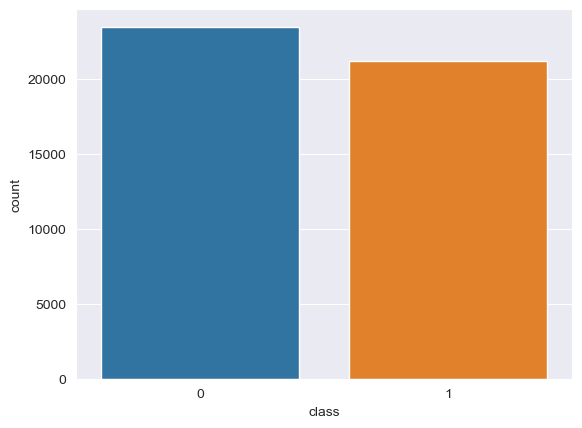

In [23]:
sns.set_style("darkgrid")
sns.countplot(x="class", data=df)
plt.show()

* Ce code génère un diagramme circulaire pour représenter la répartition des catégories (category) ou classes(classe) dans un ensemble de données, avec un modèle sombre et un titre spécifique

In [24]:
# Créer un diagramme circulaire
fig = make_subplots(1, 1, specs=[[{'type': 'pie'}]])

# Créer un diagramme circulaire pour la colonne actuelle
labels = df['class'].value_counts().index.tolist()
values = df['class'].value_counts().tolist()

fig.add_trace(go.Pie(labels=labels, values=values, hole=0.5, name='class'))
fig.update_layout(template='plotly',width=1000,title="Distribution des class dans l'ensemble de données")

fig.show()

* Ce code crée un diagramme circulaire (ou camembert) pour visualiser la répartition du domaine de l'actualité(subjects) dans un ensemble de données.

In [25]:
# Créer un diagramme circulaire
fig = make_subplots(1, 1, specs=[[{'type': 'pie'}]])

# Créer un diagramme circulaire pour la colonne actuelle
labels = df['subject'].value_counts().index.tolist()
values = df['subject'].value_counts().tolist()

fig.add_trace(go.Pie(labels=labels, values=values, hole=0.5, name='Subject'))
fig.update_layout(template='plotly',width=1000,title="Répartition du domaine d'actualité (subjects)")

fig.show()

* Ce code crée un histogramme interactif pour visualiser la répartition du domaine de l'actualité(subjects) au fil du temps(date).

In [26]:
fig = px.histogram(data_frame=df,x=df.index,color="subject",marginal='box',pattern_shape='subject')
fig.update_layout(template='plotly',width=1000,title="Domaine de l'actualité(subjects) au fil du temps(date)")

<AxesSubplot:>

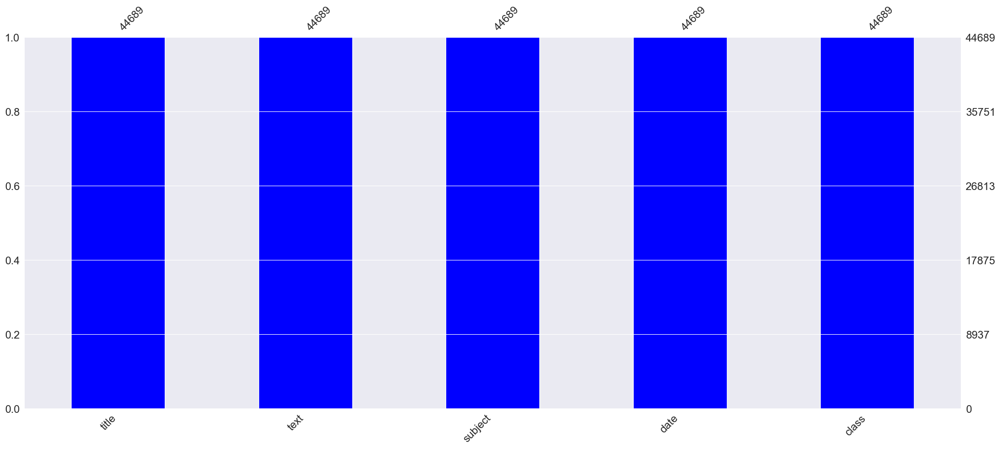

In [27]:
import missingno as msno
msno.bar(df, color = 'b')

[Text(0, 0, 'left-news'),
 Text(1, 0, 'News'),
 Text(2, 0, 'politics'),
 Text(3, 0, 'politicsNews'),
 Text(4, 0, 'Government News'),
 Text(5, 0, 'worldnews'),
 Text(6, 0, 'US_News'),
 Text(7, 0, 'Middle-east')]

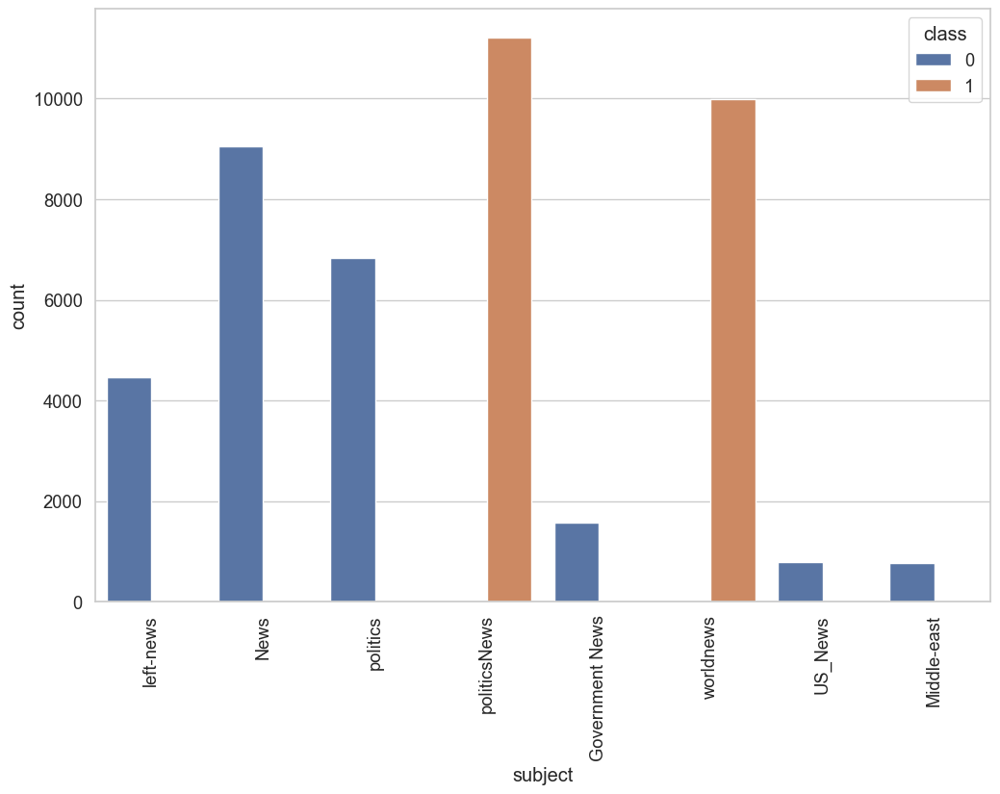

In [28]:
plt.figure(figsize = (12,8))
sns.set(style = "whitegrid",font_scale = 1.2)
chart = sns.countplot(x = "subject", hue = "class" , data = df)
chart.set_xticklabels(chart.get_xticklabels(),rotation=90)

In [29]:
df.head()

,title,text,subject,date,class
0,CNN’S JIM ACOSTA Schooled on the Meaning of th...,We wish President Trump could clone SENIOR ADV...,left-news,"Aug 2, 2017",0
1,A New Bill In Missouri Would Allow Your Emplo...,In a move that will most likely never be descr...,News,"June 22, 2017",0
2,Key Trump Supporter And Major Donor: Trump Is...,"Donald Trump isn t just losing in the polls, a...",News,"August 7, 2017",0
3,Ground Zero Mosque Was NOT Defeated: Three Sto...,Will the new 3-story Islamic Museum include pi...,politics,"Sep 29, 2015",0
4,EXPOSED POPULATION CONTROL CAMPAIGN: Influenti...,The same guy who donated tens of millions of d...,politics,"Oct 20, 2015",0


**Nettoyage des données Data cleaning, Nettoyage du texte Text Preprocessing**

- Tokenisation
- Mise en minuscules
- Suppression des mots vides
- Suppression de la ponctuation et des caractères spéciaux

* Étant donné que les sujets de la colonne 'subject' sont différents pour les deux catégories, nous devons donc les exclure de la colonne de texte final

In [30]:
df['text'] = df['text'] + " " + df['title']
del df['title']
del df['subject']
del df['date']

In [31]:
df.head()

,text,class
0,We wish President Trump could clone SENIOR ADV...,0
1,In a move that will most likely never be descr...,0
2,"Donald Trump isn t just losing in the polls, a...",0
3,Will the new 3-story Islamic Museum include pi...,0
4,The same guy who donated tens of millions of d...,0


**QU'EST-CE QUE LES MOTS VIDES ?**

Les mots vides sont des mots anglais qui n'ajoutent pas beaucoup de sens à une phrase. Ils peuvent être ignorés sans sacrifier le sens de la phrase. Par exemple, des mots comme "le", "il", "avoir", etc. Ces mots sont déjà inclus dans le corpus nommé corpus. Nous le téléchargeons d'abord dans notre environnement Python.

In [32]:
#import nltk
#nltk.download('stopwords')

In [33]:
stop = set(stopwords.words('english'))
punctuation = list(string.punctuation)
stop.update(punctuation)

In [34]:
def strip_html(text):
    soup = BeautifulSoup(text, "html.parser")
    return soup.get_text()

In [35]:
# Suppression des crochets carrés
def remove_between_square_brackets(text):
    return re.sub('\[[^]]*\]', '', text)


In [36]:
# Suppression des URL
def remove_between_square_brackets(text):
    return re.sub(r'http\S+', '', text)


In [37]:
# Suppression des mots vides du texte
def remove_stopwords(text):
    final_text = []
    for i in text.split():
        if i.strip().lower() not in stop:
            final_text.append(i.strip())
    return " ".join(final_text)


In [38]:
# Suppression du texte bruyant
def denoise_text(text):
    text = strip_html(text)
    text = remove_between_square_brackets(text)
    text = remove_stopwords(text)
    return text


In [39]:
# Appliquer une fonction sur la colonne de commentaire
df['text']=df['text'].apply(denoise_text)

C:\Users\fofna\anaconda3\lib\site-packages\bs4\__init__.py:435: MarkupResemblesLocatorWarning:

The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.



In [40]:
df.head()

,text,class
0,wish President Trump could clone SENIOR ADVISO...,0
1,"move likely never described progress, state Mi...",0
2,"Donald Trump losing polls, even base, libertar...",0
3,new 3-story Islamic Museum include pictures Am...,0
4,guy donated tens millions dollars Obama campai...,0


**Nuage de mots pour les vrais textes (class = 1)**

In [41]:
from wordcloud import WordCloud
from wordcloud import WordCloud, STOPWORDS

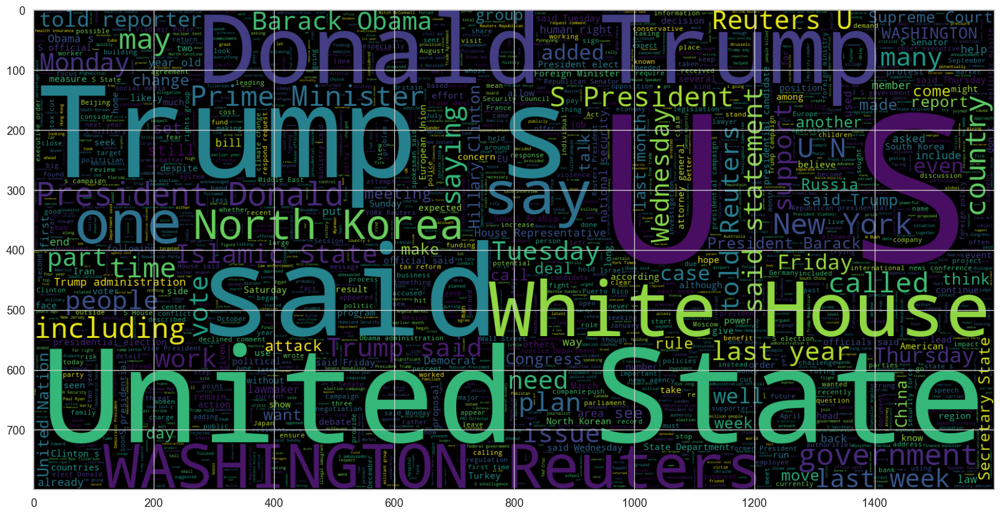

In [42]:
plt.figure(figsize = (20,20)) # Text that is not Fake
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 ,
               stopwords = STOPWORDS).generate(" ".join(df[df["class"] == 1].text))
plt.imshow(wc , interpolation = 'bilinear')

**Nuage de mots pour les faux textes (class == 0)**

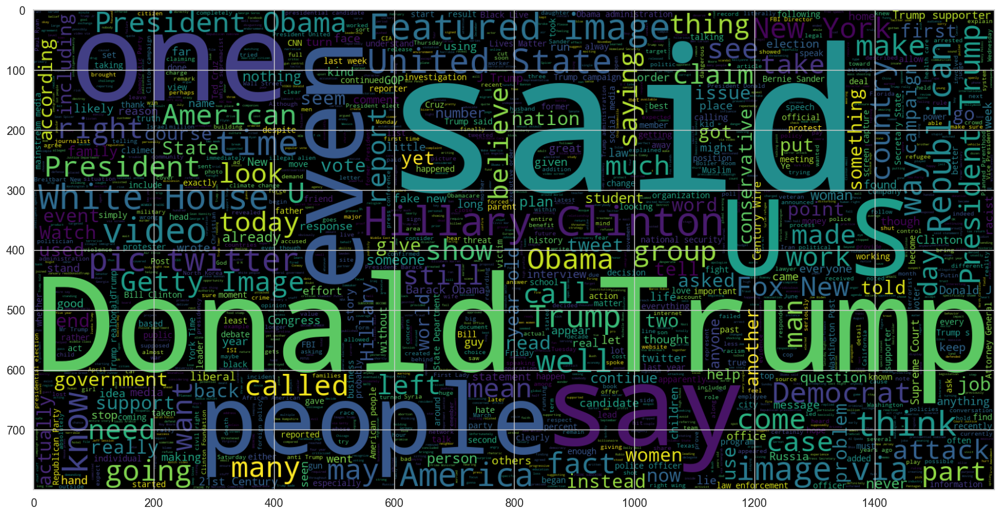

In [43]:
plt.figure(figsize = (20,20)) # Text that is Fake
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = STOPWORDS).generate(" ".join(df[df["class"] == 0].text))
plt.imshow(wc , interpolation = 'bilinear')

**Le nombre de caractères dans les textes**

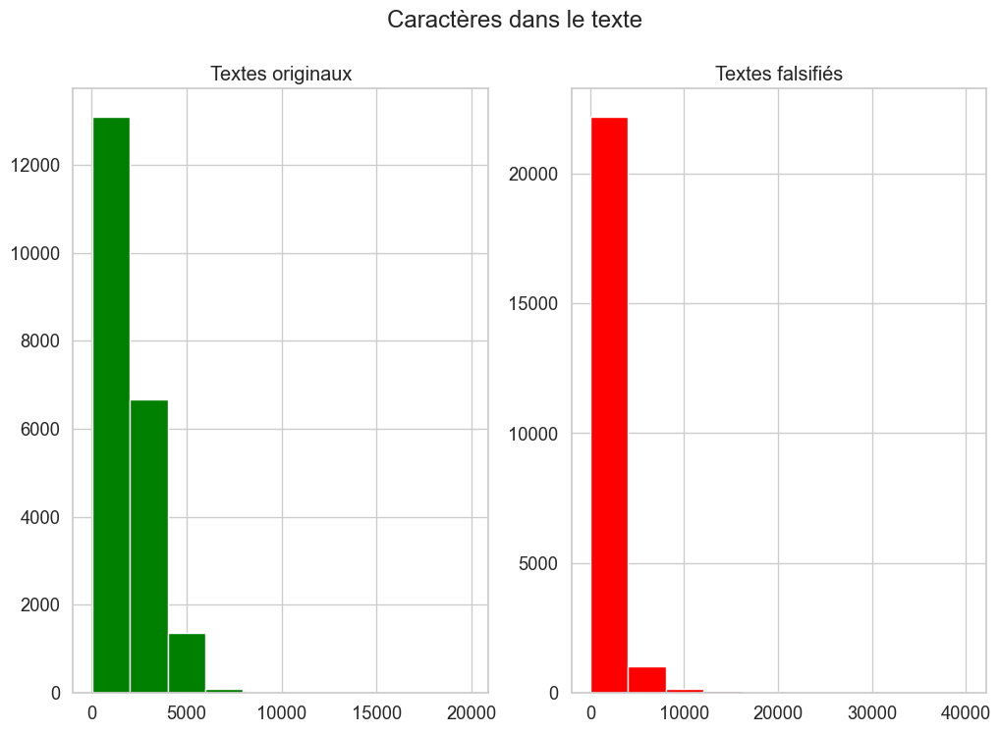

In [44]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(12,8))
text_len=df[df['class']==1]['text'].str.len()
ax1.hist(text_len,color='green')
ax1.set_title('Textes originaux')
text_len=df[df['class']==0]['text'].str.len()
ax2.hist(text_len,color='red')
ax2.set_title('Textes falsifiés')
fig.suptitle('Caractères dans le texte')
plt.show()

La distribution des deux semble être un peu différente. 2500 caractères dans le texte sont les plus courants dans la catégorie des textes originaux, tandis qu'environ 5000 caractères dans le texte sont les plus courants dans la catégorie des textes falsifiés.

**Le nombre de mots dans chaque texte**

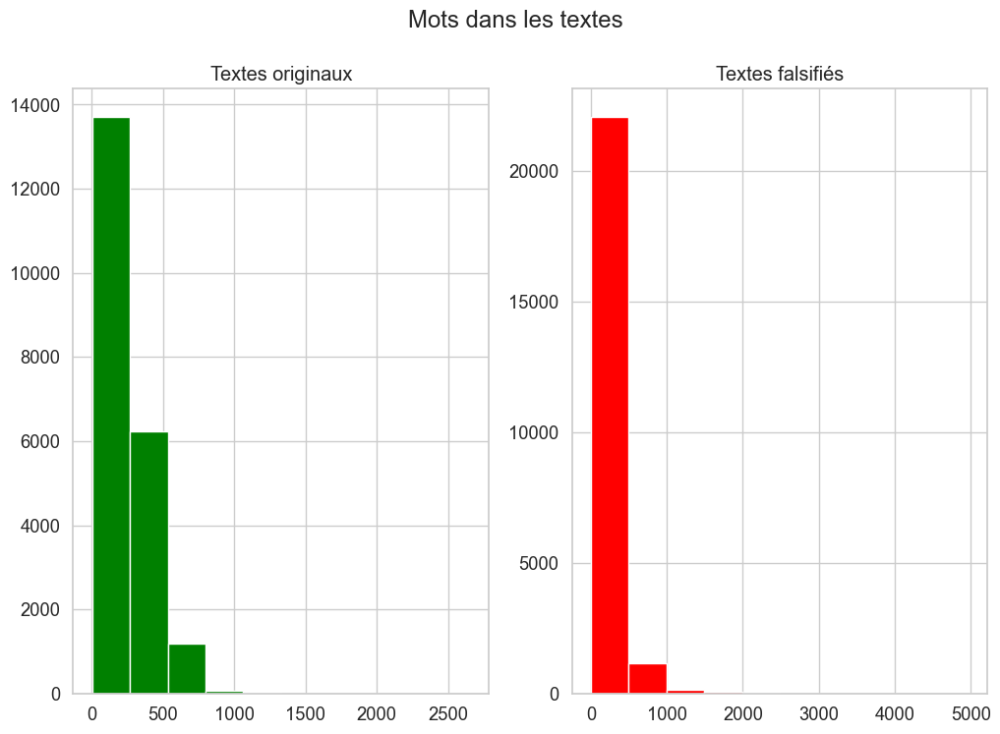

In [45]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(12,8))
text_len=df[df['class']==1]['text'].str.split().map(lambda x: len(x))
ax1.hist(text_len,color='green')
ax1.set_title('Textes originaux')
text_len=df[df['class']==0]['text'].str.split().map(lambda x: len(x))
ax2.hist(text_len,color='red')
ax2.set_title('Textes falsifiés')
fig.suptitle('Mots dans les textes')
plt.show()

**La longueur moyenne des mots dans un texte**

C:\Users\fofna\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\fofna\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning:

Mean of empty slice.

C:\Users\fofna\anaconda3\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning:

invalid value encountered in scalar divide

C:\Users\fofna\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



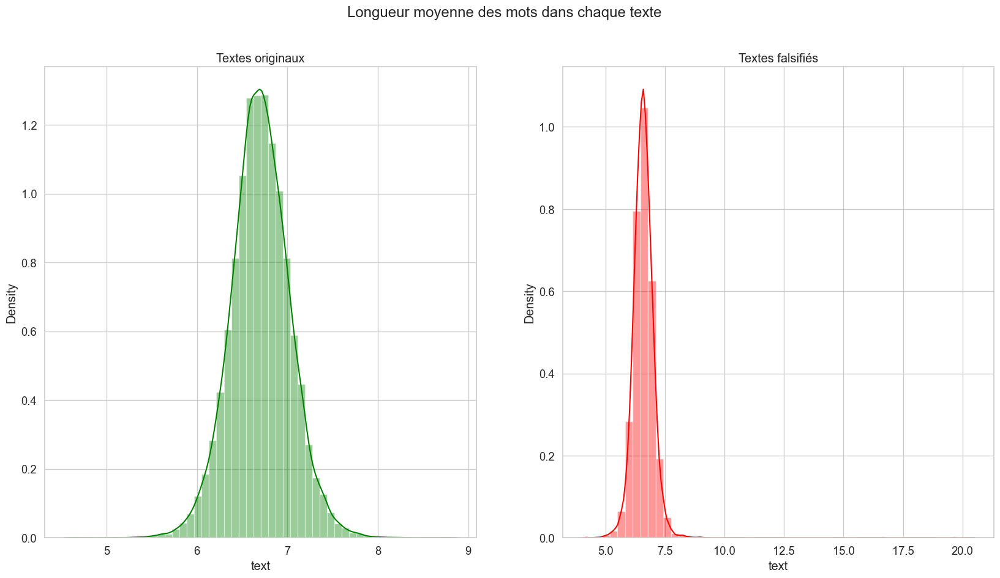

In [46]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(20,10))
word=df[df['class']==1]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='green')
ax1.set_title('Textes originaux')
word=df[df['class']==0]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='red')
ax2.set_title('Textes falsifiés')
fig.suptitle('Longueur moyenne des mots dans chaque texte')
plt.show()

In [47]:
def get_corpus(text):
    words = []
    for i in text:
        for j in i.split():
            words.append(j.strip())
    return words
corpus = get_corpus(df.text)
corpus[:5]

['wish', 'President', 'Trump', 'could', 'clone']

In [48]:
from collections import Counter
counter = Counter(corpus)
most_common = counter.most_common(10)
most_common = dict(most_common)
most_common

{'Trump': 111030,
 'said': 92293,
 'would': 54255,
 'U.S.': 49972,
 'President': 32988,
 'people': 32966,
 'also': 30125,
 'one': 29250,
 'Donald': 27722,
 'said.': 25929}

Ce code définit une fonction appelée get_top_text_ngrams qui extrait les n-grammes les plus courants à partir d'un corpus de texte.

In [49]:
from sklearn.feature_extraction.text import CountVectorizer
def get_top_text_ngrams(corpus, n, g):
    vec = CountVectorizer(ngram_range=(g, g)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

**Analyse des unigrammes**

<AxesSubplot:>

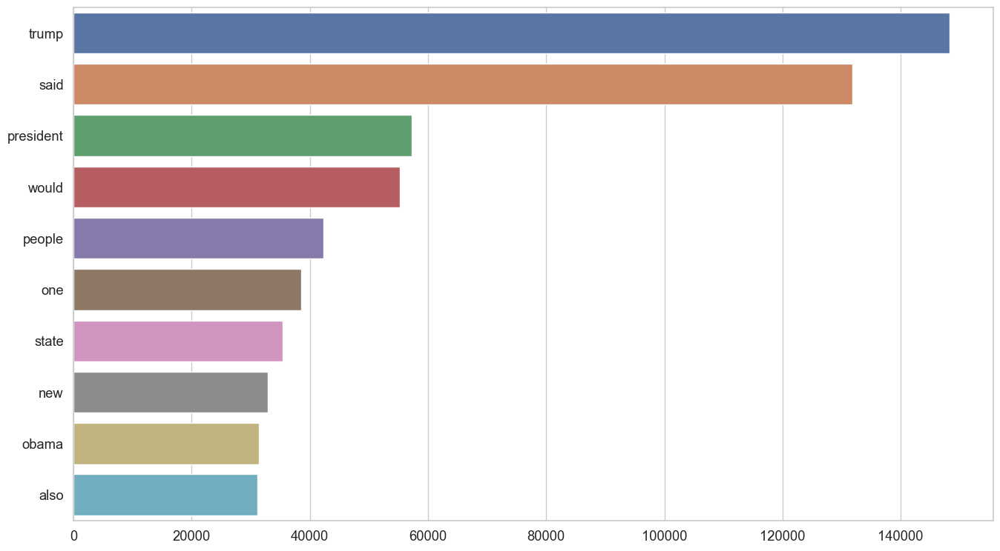

In [50]:
plt.figure(figsize = (16,9))
most_common_uni = get_top_text_ngrams(df.text,10,1)
most_common_uni = dict(most_common_uni)
sns.barplot(x=list(most_common_uni.values()),y=list(most_common_uni.keys()))

**Analyse des bigrammes**

<AxesSubplot:>

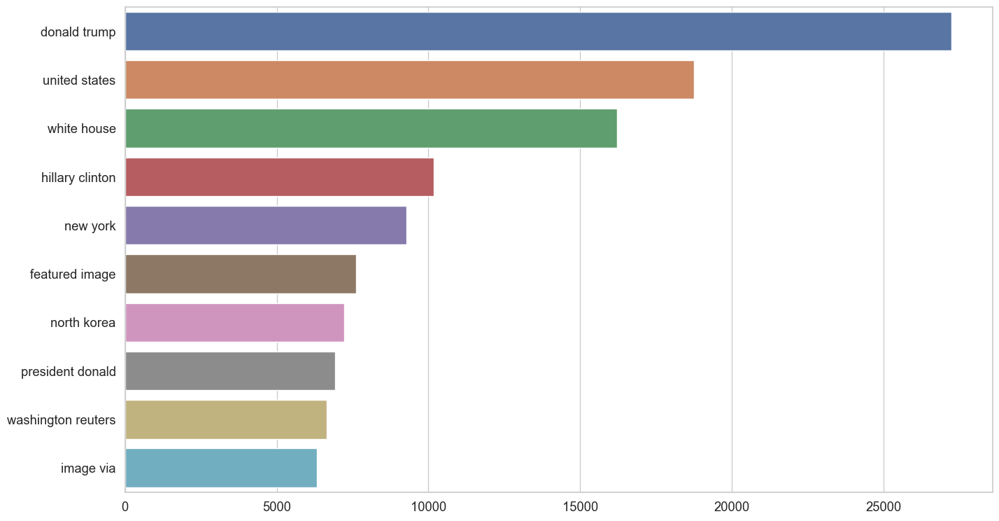

In [51]:
plt.figure(figsize = (16,9))
most_common_bi = get_top_text_ngrams(df.text,10,2)
most_common_bi = dict(most_common_bi)
sns.barplot(x=list(most_common_bi.values()),y=list(most_common_bi.keys()))

**Analyse des trigrammes**

<AxesSubplot:>

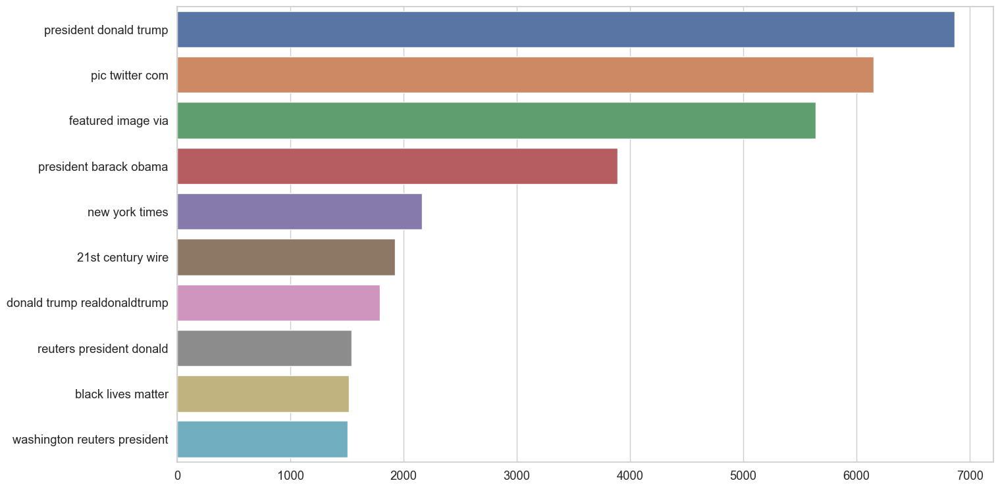

In [52]:
plt.figure(figsize = (16,9))
most_common_tri = get_top_text_ngrams(df.text,10,3)
most_common_tri = dict(most_common_tri)
sns.barplot(x=list(most_common_tri.values()),y=list(most_common_tri.keys()))

## Diviser les données en 2 parties : données d'entraînement et données de test

In [53]:
X_train,X_test,y_train,y_test = train_test_split(df['text'],df['class'],test_size=0.2, random_state = 10)

**TF-IDF (Term Frequency - Inverse Document Frequency)**

TF-IDF (Term Frequency - Inverse Document Frequency) est une mesure utilisée en traitement du langage naturel pour évaluer l'importance d'un terme dans un document par rapport à une collection de documents. Cette mesure combine deux aspects :

1. La fréquence du terme (TF - Term Frequency) : qui mesure le nombre de fois qu'un terme apparaît dans un document. Les termes qui apparaissent plus fréquemment dans un document ont une importance plus grande.

2. L'inverse de la fréquence du document (IDF - Inverse Document Frequency) : qui mesure à quel point un terme est commun ou rare dans l'ensemble des documents. Les termes qui apparaissent dans de nombreux documents ont une importance plus faible, tandis que ceux qui apparaissent dans un petit nombre de documents ont une importance plus grande.

En combinant ces deux aspects, TF-IDF attribue un score à chaque terme qui reflète à la fois sa fréquence dans un document particulier et son importance dans l'ensemble des documents. Cela permet de mettre en évidence les termes qui sont à la fois fréquents dans un document spécifique et rares dans l'ensemble de la collection de documents, ce qui peut aider à identifier les termes les plus significatifs et caractéristiques pour ce document. TF-IDF est largement utilisé dans diverses tâches de traitement du langage naturel, telles que la recherche d'informations, la classification de documents et la recommandation de contenu.

In [54]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer()
X_train = tfidf.fit_transform(X_train)
X_test = tfidf.transform(X_test)

In [55]:
print(y_train)

26734    1
8297     0
32328    1
10457    0
17148    1
        ..
40220    0
28101    1
29287    0
40222    1
17710    0
Name: class, Length: 35751, dtype: int64


In [56]:
print(X_train)

  (0, 105009)	0.05123700402960569
  (0, 18467)	0.05305171885595446
  (0, 46048)	0.043380603218123946
  (0, 33013)	0.0330063546825967
  (0, 95087)	0.01919594215884457
  (0, 25451)	0.015969428204198447
  (0, 101267)	0.04733396749979267
  (0, 43974)	0.04806328943995701
  (0, 103037)	0.06761367186298699
  (0, 29753)	0.02818480759047043
  (0, 10767)	0.03257869451567999
  (0, 8172)	0.03168819893038265
  (0, 66360)	0.023880997439506082
  (0, 81917)	0.027671018498863165
  (0, 46845)	0.05057604315810741
  (0, 20385)	0.047247612588033956
  (0, 48928)	0.031092367369027322
  (0, 85374)	0.031131967815246492
  (0, 14954)	0.032429595420232764
  (0, 73962)	0.02327458122763006
  (0, 14445)	0.03539066554972281
  (0, 68359)	0.025882802143368938
  (0, 106527)	0.02450006685234672
  (0, 73071)	0.0195233257903272
  (0, 75782)	0.01925238535463957
  :	:
  (35750, 48195)	0.02040075518464064
  (35750, 12147)	0.03777161738446055
  (35750, 103241)	0.07639236249403551
  (35750, 73915)	0.014646531533982172
  (35750,

In [57]:
print(X_train.shape)
print(X_test.shape)

(35751, 108836)
(8938, 108836)


# Entrainement et évaluation du modèle entrainer

In [58]:
from sklearn.metrics import accuracy_score, confusion_matrix

In [59]:
# Regression logistique
from sklearn.linear_model import LogisticRegression

model1 = LogisticRegression()
model1.fit(X_train, y_train)
pred1 = model1.predict(X_test)

In [60]:
accuracy1 = accuracy_score(y_test, pred1)
print("Résultats de la régression logistique :")
print("--------------------------------------------------")
print("Exactitude (Accuracy) : {:.3f}".format(accuracy1))
print("--------------------------------------------------")

Résultats de la régression logistique :
--------------------------------------------------
Exactitude (Accuracy) : 0.991
--------------------------------------------------


In [61]:
#!pip install mlxtend

Matrix de Confusion  regression logistic
Accuracy score : 0.9906019243678675


(<Figure size 640x480 with 2 Axes>,
 <AxesSubplot:xlabel='predicted label', ylabel='true label'>)

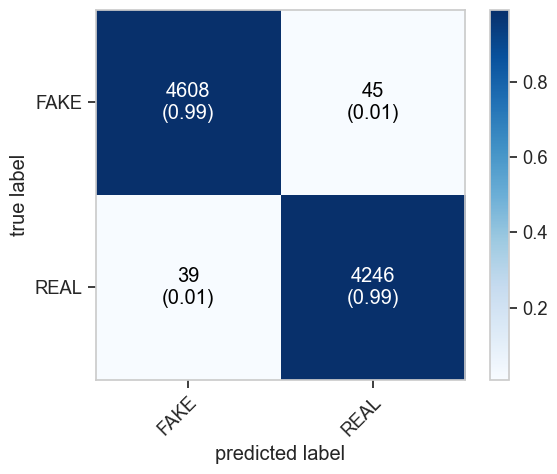

In [62]:
## Matrice de confution
from mlxtend.plotting import plot_confusion_matrix

cm1 = confusion_matrix(y_test, pred1)
print("Matrix de Confusion  regression logistic")
print("Accuracy score : {}".format(accuracy1, 2))
plot_confusion_matrix(conf_mat=cm1,show_absolute=True,
                                show_normed=True,
                                colorbar=True,class_names=['FAKE','REAL'])

In [63]:
# Kplus proche voisin
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier
model2 = KNeighborsClassifier()
model2.fit(X_train, y_train)
pred2 = model2.predict(X_test)

In [64]:
accuracy2 = accuracy_score(y_test,pred2)
print("Résultats des k plus proche voisin :")
print("--------------------------------------------------")
print("Exactitude (Accuracy) : {:.3f}".format(accuracy2))
print("--------------------------------------------------")

Résultats des k plus proche voisin :
--------------------------------------------------
Exactitude (Accuracy) : 0.663
--------------------------------------------------


Matrix de Confusion K plus proche voisin
Accuracy score : 0.66


(<Figure size 640x480 with 2 Axes>,
 <AxesSubplot:xlabel='predicted label', ylabel='true label'>)

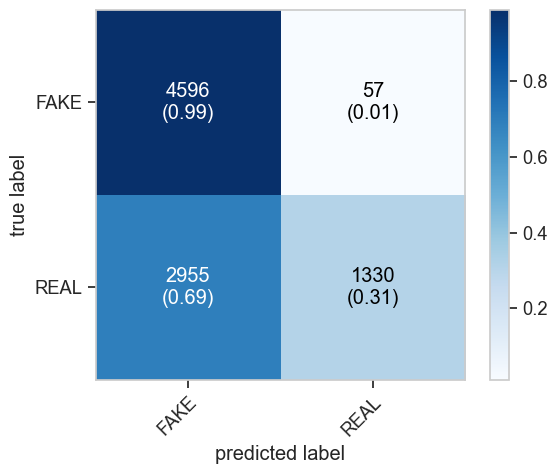

In [65]:
from mlxtend.plotting import plot_confusion_matrix
cm2 = confusion_matrix(y_test,pred2)
print("Matrix de Confusion K plus proche voisin")
print("Accuracy score : {}".format(round(accuracy2, 2)))
plot_confusion_matrix(conf_mat=cm2,show_absolute=True,
                                show_normed=True,
                                colorbar=True,class_names=['FAKE','REAL'])

In [66]:
import warnings
from sklearn.exceptions import DataConversionWarning

# Ignorer les avertissements de conversion de données et la FutureWarning de mode
warnings.filterwarnings(action='ignore', category=DataConversionWarning)
warnings.filterwarnings(action='ignore', category=FutureWarning)

# Initialisation des modèles
models = {
    "Logistic Regression": LogisticRegression(),
    "Knn": KNeighborsClassifier()
    #"Arbre de decision": DecisionTreeClassifier()
}

# Entraînement et évaluation des modèles
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=["FAKE", "TRUE"])
    print(f"Model: {name}")
    print(f"Accuracy: {accuracy}")
    print(f"Classification Report:\n{report}\n")


Model: Logistic Regression
Accuracy: 0.9906019243678675
Classification Report:
              precision    recall  f1-score   support

        FAKE       0.99      0.99      0.99      4653
        TRUE       0.99      0.99      0.99      4285

    accuracy                           0.99      8938
   macro avg       0.99      0.99      0.99      8938
weighted avg       0.99      0.99      0.99      8938


Model: Knn
Accuracy: 0.663011859476393
Classification Report:
              precision    recall  f1-score   support

        FAKE       0.61      0.99      0.75      4653
        TRUE       0.96      0.31      0.47      4285

    accuracy                           0.66      8938
   macro avg       0.78      0.65      0.61      8938
weighted avg       0.78      0.66      0.62      8938




# Optimisation et évaluation du modèle optimisé

In [67]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import classification_report

# Initialisation des modèles avec leurs hyperparamètres
models = {
    "Logistic Regression": LogisticRegression(),
    "Knn": KNeighborsClassifier()
}

# Définition des grilles de recherche d'hyperparamètres pour chaque modèle
param_grid = {
    "Logistic Regression": {'C': [0.001, 0.01, 0.1, 1, 10, 100]},
    "Knn": {'n_neighbors': [3, 5, 7]}
}

# Optimisation des modèles
best_models = {}
for name, model in models.items():
    grid_search = GridSearchCV(model, param_grid[name], cv=3, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_

# Évaluation des modèles optimisés avec validation croisée
for name, model in best_models.items():
    scores = cross_val_score(model, X_train, y_train, cv=3, scoring='accuracy')
    print(f"Model: {name}")
    print(f"Cross-Validation Accuracy: {np.mean(scores)} (+/- {np.std(scores) * 2})")
    y_pred = model.predict(X_test)
    report = classification_report(y_test, y_pred, target_names=["FAKE", "TRUE"])
    print(f"Classification Report:\n{report}\n")


Model: Logistic Regression
Cross-Validation Accuracy: 0.9949651757992783 (+/- 0.0007250975579320822)
Classification Report:
              precision    recall  f1-score   support

        FAKE       1.00      1.00      1.00      4653
        TRUE       1.00      1.00      1.00      4285

    accuracy                           1.00      8938
   macro avg       1.00      1.00      1.00      8938
weighted avg       1.00      1.00      1.00      8938


Model: Knn
Cross-Validation Accuracy: 0.6636178009006741 (+/- 0.0051933195559397734)
Classification Report:
              precision    recall  f1-score   support

        FAKE       0.64      0.98      0.77      4653
        TRUE       0.95      0.39      0.55      4285

    accuracy                           0.70      8938
   macro avg       0.80      0.69      0.66      8938
weighted avg       0.79      0.70      0.67      8938




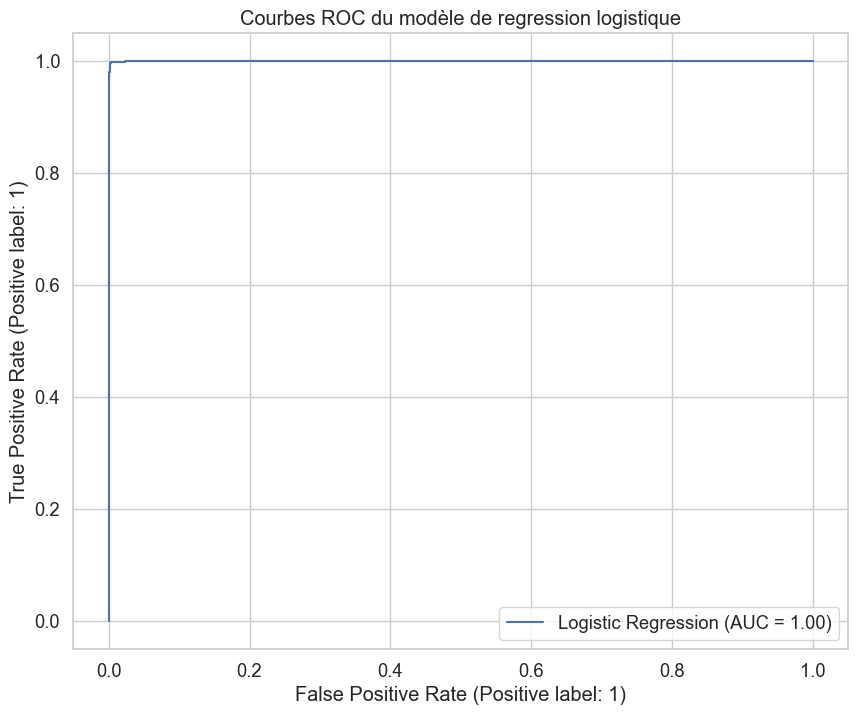

In [68]:
import matplotlib.pyplot as plt
from sklearn.metrics import plot_roc_curve

# Tracer les courbes ROC pour chaque modèle
plt.figure(figsize=(10, 8))

# Modèle de Régression Logistique
plot_roc_curve(best_models["Logistic Regression"], X_test, y_test, ax=plt.gca(), name="Logistic Regression")

plt.title('Courbes ROC du modèle de regression logistique')
plt.legend(loc='lower right')
plt.show()


In [ ]:
http://localhost:8888/tree